# Imports

In [10]:
from waveFOM import *
from ROM import *
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(0)


In [11]:
"""Set the matplotlib configuration."""
plt.rcParams.update(plt.rcParamsDefault)
plt.rc("figure", dpi=300)
plt.rc("font", size=14, family="serif")
plt.rc("legend", frameon=False)
plt.rc("text", usetex=True)
plt.rc("text.latex", preamble=r"\usepackage{amsmath}")


# Experiment parameters

In [12]:
# Number of nodes in the spatial grid 
N = 60
# Wave speed
c = 1
# Total number of independent initial conditions sampled (training + testing)
Ns = 150
# Proportion of Ns to be set aside for testing
testFrac = 0.2
# Time horizon
Tf = 2*np.pi
# FOM object
FO = waveFOM(N=N)

# Case with time-invariant PDE parameters

## (a) $\gamma_1 = 0.25 = \gamma_2$

In [4]:
gamma_p = 0.25
gamma_q = 0.25
R_true = -gamma_q*np.eye(N)
K_true0 = c**2*FO.Dmat@FO.Dmat
trainIP, testIP = FO.create_grand_data_tensor(Ns, Tf, c, gamma_q, gamma_p, test_size=testFrac, atol=1e-12)

In [6]:
prev_errK = np.nan
prev_errR = np.nan
R_true = -gamma_q*np.eye(N)

print(f"{'dt':>12} {'error in phi':>20} {'error in K':>20} {'Rate (K)':>20} {'error in R':>20} {'Rate (R)':>20}")
for i in range(4, 7):
    dt = 1 / 2**i
    Nt = int(Tf / dt)
    t_eval = np.linspace(0, Tf, Nt + 1)

    train = np.array([j(t_eval) for j in trainIP])
    test = np.array([j(t_eval) for j in testIP])

    qTrain, pTrain = np.split(train, 2, axis=1)
    qTest, pTest = np.split(test, 2, axis=1)
    
    qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])

    rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="direct")
    rom.train()

    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    err = np.linalg.norm(sol - qTest)/np.linalg.norm(qTest)

    K_true = np.zeros_like(rom.K)
    for i in range(K_true.shape[-1]): 
        K_true[:,:,i] = np.exp(-gamma_p*t_eval[i])*K_true0

    errK = np.linalg.norm(rom.K[:,:,1:] - K_true[:,:,1:])/ np.linalg.norm(K_true[:,:,1:])
    errR  = np.linalg.norm(rom.R[:,:,0] - R_true) / np.linalg.norm(R_true)

    ratio = np.log2(prev_errK / errK) if np.isfinite(prev_errK) else np.nan
    ratio2 = np.log2(prev_errR / errR) if np.isfinite(prev_errR) else np.nan
    
    print(f"{dt:12.4e} {err:20.2e} {errK:20.2e} {ratio:20.2f} {errR:20.2e} {ratio2:20.2f}")
    if err > 1e4:
        break
    prev_errK = errK
    prev_errR = errR

          dt         error in phi           error in K             Rate (K)           error in R             Rate (R)
  6.2500e-02             2.30e-12             3.94e-01                  nan             6.43e-01                  nan
  3.1250e-02             2.29e-12             7.47e-02                 2.40             1.05e-01                 2.61
  1.5625e-02             2.28e-12             1.79e-02                 2.06             2.44e-02                 2.11


In [6]:
sol1 = sol
t1 = t_eval
PhiTest1 = qTest
rom1 = rom

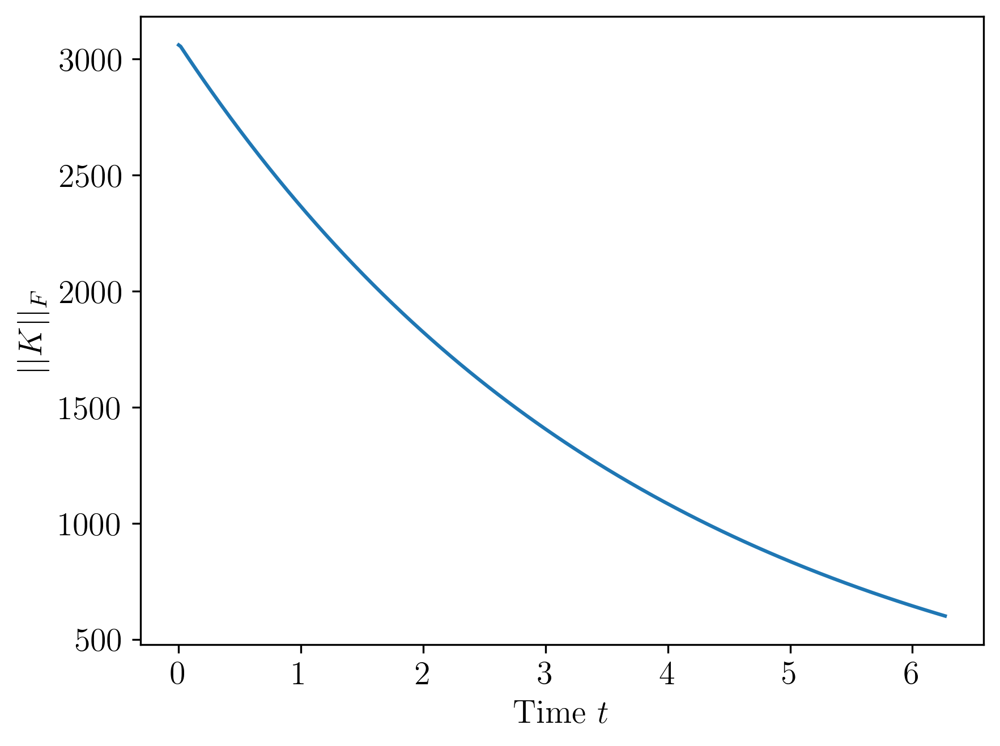

In [7]:
Knorms = [np.linalg.norm(rom.K[:,:,i]) for i in range(rom.K.shape[-1])]
plt.figure()
plt.plot(t_eval[:-1], Knorms)
plt.xlabel(r"Time $t$")
plt.ylabel(r"$||K||_F$")
plt.show()

In [8]:
FO.animate(qTest, t_eval, k=5)

In [9]:
m = [1, 0.5, 0.3, 0.2, 0.1]
mLabels = [r"$100\%$", r"$50\%$", r"$30\%$", r"$20\%$", r"$10\%$"]
dt = 0.0625
Nt = int(Tf / dt)
t_eval = np.linspace(0, Tf, Nt + 1)
train = np.array([j(t_eval) for j in trainIP])
test = np.array([j(t_eval) for j in testIP])
qTrain, pTrain = np.split(train, 2, axis=1)
qTest, pTest = np.split(test, 2, axis=1)
qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])
PhiTest1 = qTest

Memory support:  $100\%$ Error:  0.004666785861945396
Memory support:  $50\%$ Error:  0.03251060430037635
Memory support:  $30\%$ Error:  0.060749510466161324
Memory support:  $20\%$ Error:  0.0932335492655682
Memory support:  $10\%$ Error:  0.14947601937004362


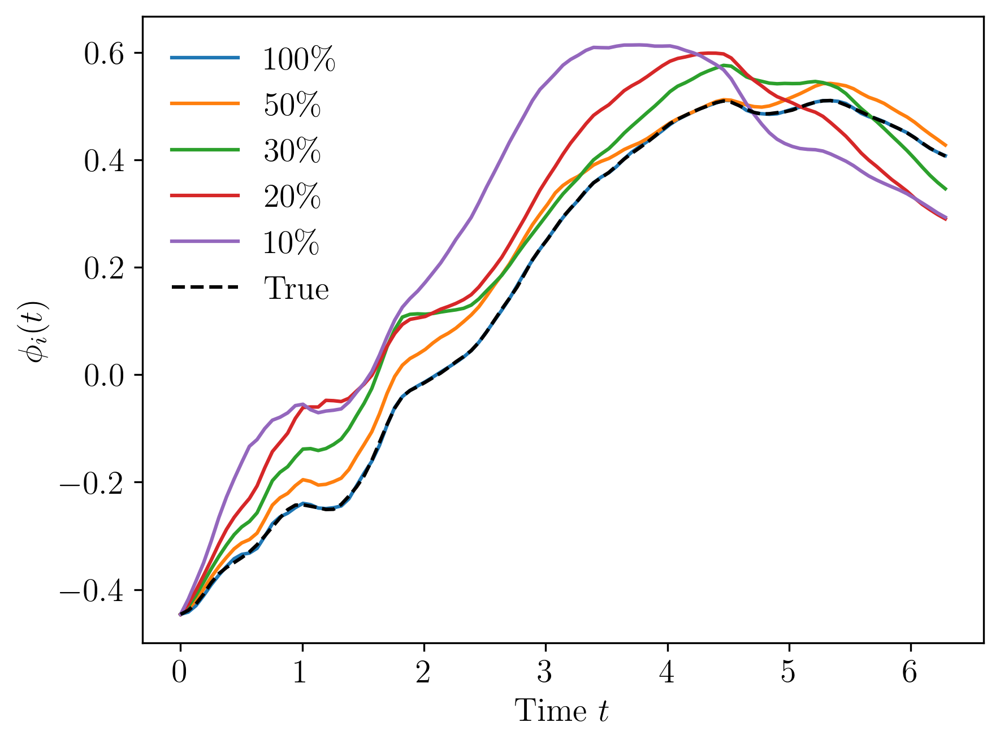

In [11]:
rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="lsqr", maxiter=2000)
sol1_2 = []
plt.figure()
for i,h in enumerate(m):
    rom.train(memorySupport=h)
    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    sol1_2.append(sol)
    print(r"Memory support: ", mLabels[i], "Error: ", np.linalg.norm(sol - qTest)/np.linalg.norm(qTest))
    plt.plot(t_eval, sol[0][0], label=mLabels[i])
plt.plot(t_eval, qTest[0][0],"--k", label="True")
plt.legend()
plt.ylabel(r"$\phi_i(t)$")
plt.xlabel(r"Time $t$")
plt.show()

# Case with time-varying PDE parameters

## (b) $\gamma_1 = 0.5\sin^2 t, \gamma_2 = 1$

In [ ]:
gamma_q = lambda t: 0.5*np.sin(t)**2
gamma_p = 1
c = 1

K_true0 = c**2*FO.Dmat@FO.Dmat
trainIP, testIP = FO.create_grand_data_tensor(Ns, Tf, c, gamma_q, gamma_p, test_size=testFrac, atol=1e-12)

In [23]:
prev_errK = np.nan
prev_errR = np.nan

K_true_fine = None  
imin, imax = 0, 7
print(f"{'dt':>12} {'error in phi':>20} {'error in K':>20} {'Rate (K)':>20} {'error in R':>20} {'Rate (R)':>20}")
for i in range(imax, imin - 1, -1):
    dt = 1 / 2**i
    Nt = int(Tf / dt)
    t_eval = np.linspace(0, Tf, Nt + 1)

    train = np.array([j(t_eval) for j in trainIP])
    test = np.array([j(t_eval) for j in testIP])

    qTrain, pTrain = np.split(train, 2, axis=1)
    qTest, pTest = np.split(test, 2, axis=1)
    
    qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])

    rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="direct")
    rom.train(constantR=False)

    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    err = np.linalg.norm(sol - qTest)/np.linalg.norm(qTest)

    R_true = np.zeros_like(rom.R)
    for j in range(R_true.shape[-1]): 
        R_true[...,j] = -gamma_q(t_eval[j]/2+t_eval[j+1]/2)*np.eye(N)
    
    if K_true_fine is None:
        # Finest grid: set truth directly
        K_true_fine = rom.K.copy()
        K_true = K_true_fine
        errK = 0.0  
    else:
        # Coarser grids: subsample the finest-grid truth
        stride = 2 ** (imax - i)  # dyadic stride from finest to current
        K_true = K_true_fine[..., ::stride]

        # Fallback if off-by-one occurs due to endpoint conventions
        if K_true.shape[2] != rom.K.shape[2]:
            idx = np.round(
                np.linspace(0, K_true_fine.shape[2] - 1, rom.K.shape[2])
            ).astype(int)
            K_true = K_true_fine[..., idx]

        if rom.K.shape != K_true.shape:
            raise ValueError(f"K shape mismatch: rom.K {rom.K.shape} vs K_true {K_true.shape}")

        errK = np.linalg.norm(rom.K - K_true) / np.linalg.norm(K_true)

    errK = np.linalg.norm(rom.K[:,:,1:] - K_true[:,:,1:])/ np.linalg.norm(K_true[:,:,1:])
    errR  = np.linalg.norm(rom.R - R_true) / np.linalg.norm(R_true)

    ratio = np.log2(prev_errK / errK) if np.isfinite(prev_errK) else np.nan
    ratio2 = np.log2(prev_errR / errR) if np.isfinite(prev_errR) else np.nan
    
    print(f"{dt:12.4e} {err:20.2e} {errK:20.2e} {ratio:20.2f} {errR:20.2e} {ratio2:20.2f}")
    if err > 1e4:
        break
    prev_errK = errK
    prev_errR = errR

sol2= sol
t2 = t_eval
PhiTest2 = qTest
rom2 = rom

          dt         error in phi           error in K             Rate (K)           error in R             Rate (R)
  7.8125e-03             2.04e-12             0.00e+00                  nan             1.02e-02                  nan


/var/folders/30/0jwhyzsj0rnb88s_49hf9shm0000gq/T/ipykernel_82922/246429048.py:55: RuntimeWarning: divide by zero encountered in log2
  ratio = np.log2(prev_errK / errK) if np.isfinite(prev_errK) else np.nan


  1.5625e-02             2.04e-12             1.41e-02                 -inf             4.09e-02                -2.01
  3.1250e-02             2.04e-12             7.40e-02                -2.39             1.78e-01                -2.12
  6.2500e-02             2.04e-12             3.98e-01                -2.43             1.12e+00                -2.66
  1.2500e-01             2.26e-12             1.25e+00                -1.65             2.70e+02                -7.91
  2.5000e-01             2.14e-12             9.55e-01                 0.38             5.38e+01                 2.33
  5.0000e-01             2.12e-12             9.74e-01                -0.03             2.32e+01                 1.21
  1.0000e+00             2.24e-12             9.95e-01                -0.03             8.91e+00                 1.38


In [15]:
m = [1, 0.5, 0.3, 0.2, 0.1]
mLabels = [r"$100\%$", r"$50\%$", r"$30\%$", r"$20\%$", r"$10\%$"]
dt = 0.0625
Nt = int(Tf / dt)
t_eval = np.linspace(0, Tf, Nt + 1)
train = np.array([j(t_eval) for j in trainIP])
test = np.array([j(t_eval) for j in testIP])
qTrain, pTrain = np.split(train, 2, axis=1)
qTest, pTest = np.split(test, 2, axis=1)
qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])
PhiTest2 = qTest

Memory support:  $100\%$ Error:  0.00617243176948358
Memory support:  $50\%$ Error:  0.0075488446838082
Memory support:  $30\%$ Error:  0.02199999995121943
Memory support:  $20\%$ Error:  0.045685889644523026
Memory support:  $10\%$ Error:  0.09059197609949533


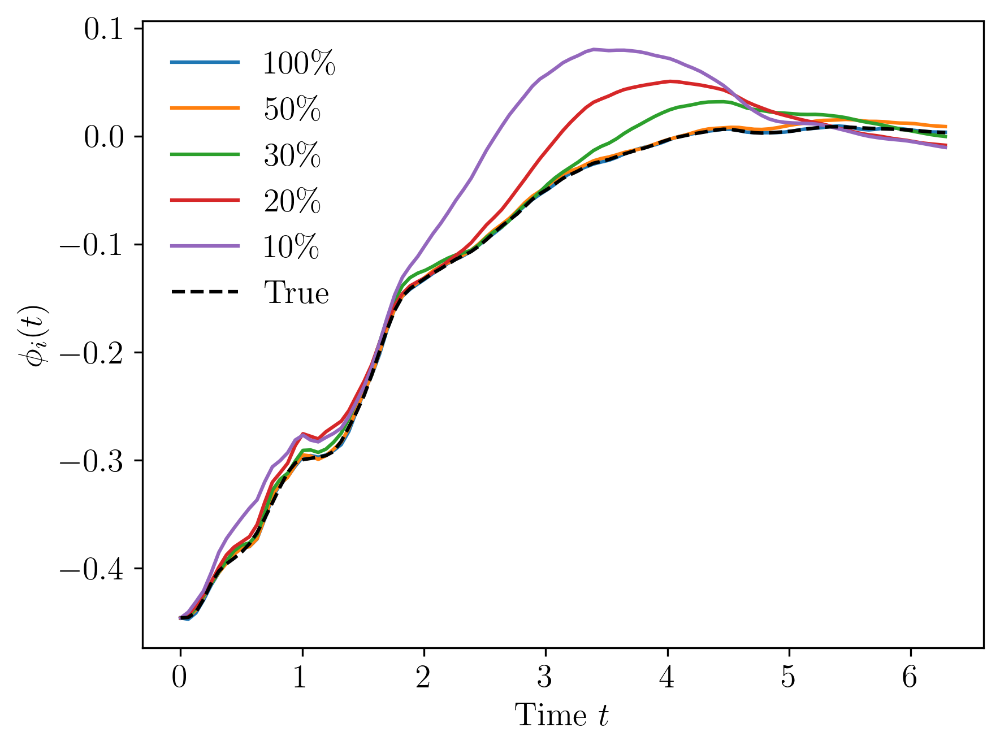

In [16]:

rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="lsqr", maxiter=2000)
sol2_2 = []
plt.figure()
for i,h in enumerate(m):
    rom.train(constantR=False, memorySupport=h)
    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    sol2_2.append(sol)
    print(r"Memory support: ", mLabels[i], "Error: ", np.linalg.norm(sol - qTest)/np.linalg.norm(qTest))
    plt.plot(t_eval, sol[0][0], label=mLabels[i])
plt.plot(t_eval, qTest[0][0],"--k", label="True")
plt.legend()
plt.ylabel(r"$\phi_i(t)$")
plt.xlabel(r"Time $t$")
plt.show()

## (c) $\gamma_1 = 0.5 \cos t, \gamma_2 = 1 + \sin(t)$

In [25]:
gamma_q = lambda t: 0.5*np.cos(t)
gamma_p = lambda t: 1 + np.sin(t)
c = 1
trainIP, testIP = FO.create_grand_data_tensor(Ns, Tf, c, gamma_q, gamma_p, test_size=testFrac, atol=1e-12)


In [26]:
prev_errK = np.nan
prev_errR = np.nan

K_true_fine = None  
imin, imax = 0, 7
print(f"{'dt':>12} {'error in phi':>20} {'error in K':>20} {'Rate (K)':>20} {'error in R':>20} {'Rate (R)':>20}")
for i in range(imax, imin - 1, -1):
    dt = 1 / 2**i
    Nt = int(Tf / dt)
    t_eval = np.linspace(0, Tf, Nt + 1)

    train = np.array([j(t_eval) for j in trainIP])
    test = np.array([j(t_eval) for j in testIP])

    qTrain, pTrain = np.split(train, 2, axis=1)
    qTest, pTest = np.split(test, 2, axis=1)
    
    qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])

    rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="direct")
    rom.train(constantR=False)

    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    err = np.linalg.norm(sol - qTest)/np.linalg.norm(qTest)

    R_true = np.zeros_like(rom.R)
    for j in range(R_true.shape[-1]): 
        R_true[...,j] = -gamma_q(t_eval[j]/2+t_eval[j+1]/2)*np.eye(N)
    
    if K_true_fine is None:
        # Finest grid: set truth directly
        K_true_fine = rom.K.copy()
        K_true = K_true_fine
        errK = 0.0  
    else:
        # Coarser grids: subsample the finest-grid truth
        stride = 2 ** (imax - i)  # dyadic stride from finest to current
        K_true = K_true_fine[..., ::stride]

        # Fallback if off-by-one occurs due to endpoint conventions
        if K_true.shape[2] != rom.K.shape[2]:
            idx = np.round(
                np.linspace(0, K_true_fine.shape[2] - 1, rom.K.shape[2])
            ).astype(int)
            K_true = K_true_fine[..., idx]

        if rom.K.shape != K_true.shape:
            raise ValueError(f"K shape mismatch: rom.K {rom.K.shape} vs K_true {K_true.shape}")

        errK = np.linalg.norm(rom.K - K_true) / np.linalg.norm(K_true)

    errK = np.linalg.norm(rom.K[:,:,1:] - K_true[:,:,1:])/ np.linalg.norm(K_true[:,:,1:])
    errR  = np.linalg.norm(rom.R - R_true) / np.linalg.norm(R_true)

    ratio = np.log2(prev_errK / errK) if np.isfinite(prev_errK) else np.nan
    ratio2 = np.log2(prev_errR / errR) if np.isfinite(prev_errR) else np.nan
    
    print(f"{dt:12.4e} {err:20.2e} {errK:20.2e} {ratio:20.2f} {errR:20.2e} {ratio2:20.2f}")
    if err > 1e4:
        break
    prev_errK = errK
    prev_errR = errR

sol2= sol
t2 = t_eval
PhiTest2 = qTest
rom2 = rom

          dt         error in phi           error in K             Rate (K)           error in R             Rate (R)
  7.8125e-03             1.59e-12             0.00e+00                  nan             8.03e-03                  nan


/var/folders/30/0jwhyzsj0rnb88s_49hf9shm0000gq/T/ipykernel_82922/246429048.py:55: RuntimeWarning: divide by zero encountered in log2
  ratio = np.log2(prev_errK / errK) if np.isfinite(prev_errK) else np.nan


  1.5625e-02             1.59e-12             1.45e-02                 -inf             3.24e-02                -2.01
  3.1250e-02             1.60e-12             7.55e-02                -2.38             1.42e-01                -2.13
  6.2500e-02             1.60e-12             3.87e-01                -2.36             9.07e-01                -2.68
  1.2500e-01             1.72e-12             1.26e+00                -1.71             1.99e+04               -14.42
  2.5000e-01             1.67e-12             9.65e-01                 0.39             3.67e+01                 9.08
  5.0000e-01             1.70e-12             9.86e-01                -0.03             2.03e+02                -2.46
  1.0000e+00             1.81e-12             9.98e-01                -0.02             9.90e+01                 1.03


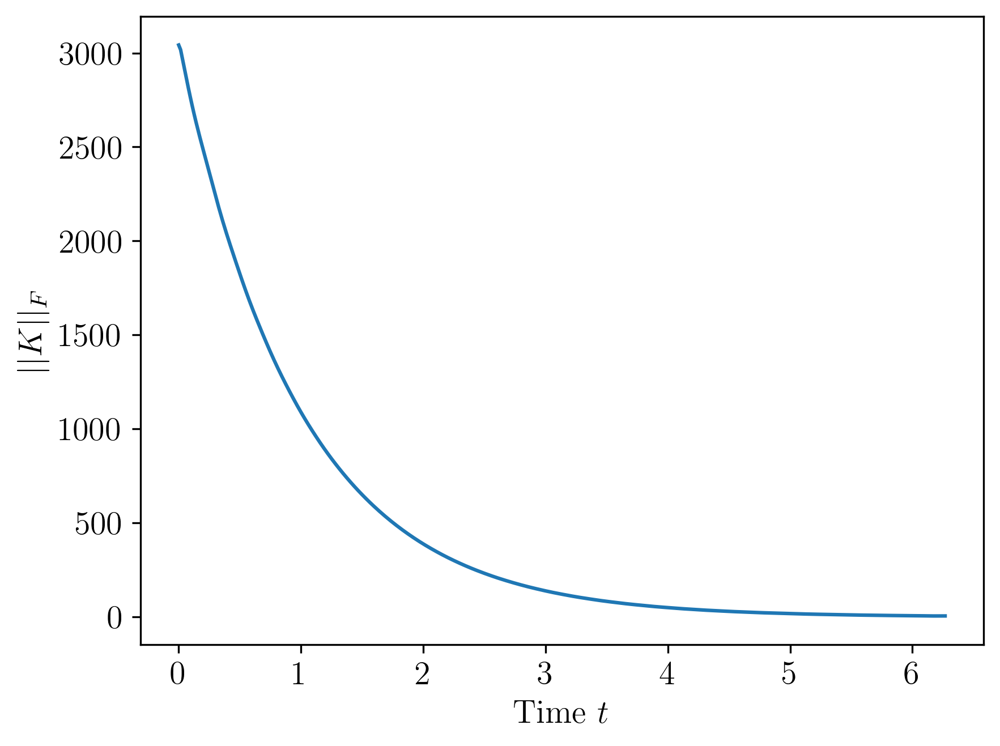

In [19]:
Knorms = [np.linalg.norm(rom.K[:,:,i]) for i in range(rom.K.shape[-1])]
plt.figure()
plt.plot(t_eval[:-1], Knorms)
plt.xlabel(r"Time $t$")
plt.ylabel(r"$||K||_F$")
plt.show()

In [20]:
m = [1, 0.5, 0.3, 0.2, 0.1]
mLabels = [r"$100\%$", r"$50\%$", r"$30\%$", r"$20\%$", r"$10\%$"]
dt = 0.0625
Nt = int(Tf / dt)
t_eval = np.linspace(0, Tf, Nt + 1)
train = np.array([j(t_eval) for j in trainIP])
test = np.array([j(t_eval) for j in testIP])
qTrain, pTrain = np.split(train, 2, axis=1)
qTest, pTest = np.split(test, 2, axis=1)
qTrainDeriv = 1/dt * (qTrain[:,:,1:] - qTrain[:,:,0:-1])
PhiTest3 = qTest

Memory support:  $100\%$ Error:  0.0025841850765776033
Memory support:  $50\%$ Error:  0.01599245021426582
Memory support:  $30\%$ Error:  0.02700366980057427
Memory support:  $20\%$ Error:  0.03292494810853095
Memory support:  $10\%$ Error:  0.04588730485665676


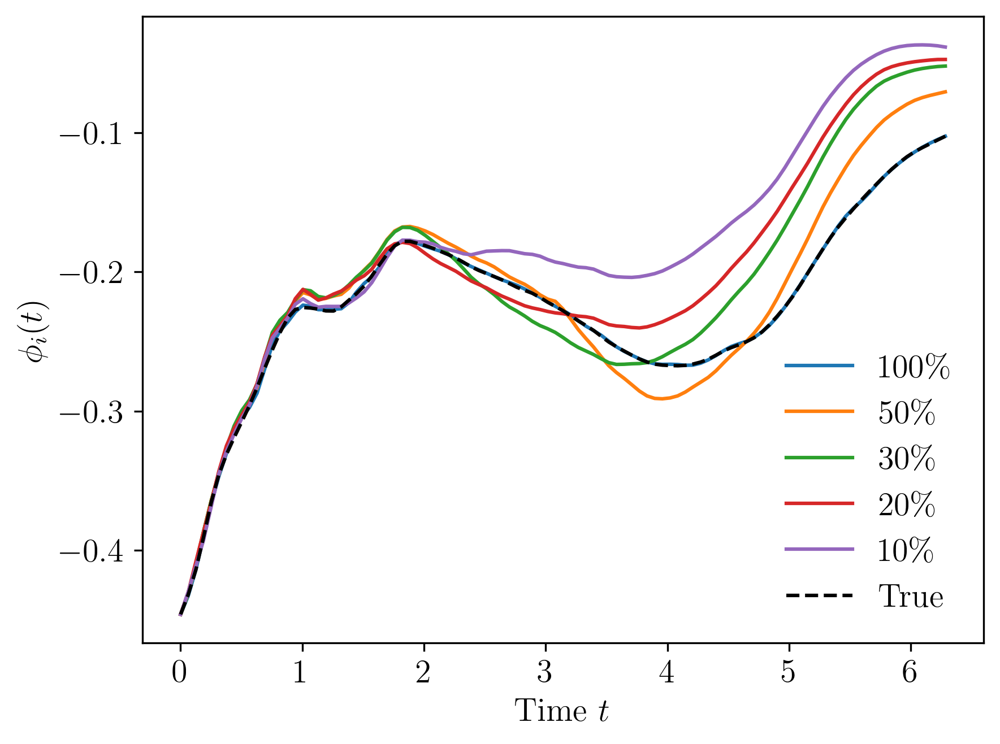

In [21]:

rom = ROM_Full_Data(qTrain, pTrain, qTrainDeriv, dt, Ksolver="lsqr", maxiter=2000)
sol3_2 = []
plt.figure()
for i,h in enumerate(m):
    rom.train(constantR=False, memorySupport=h)
    sol = rom.solve(qTest[:,:,0], pTest[:,:,0])
    sol3_2.append(sol)
    print(r"Memory support: ", mLabels[i], "Error: ", np.linalg.norm(sol - qTest)/np.linalg.norm(qTest))
    plt.plot(t_eval, sol[0][0], label=mLabels[i])
plt.plot(t_eval, qTest[0][0],"--k", label="True")
plt.legend()
plt.ylabel(r"$\phi_i(t)$")
plt.xlabel(r"Time $t$")
plt.show()

In [22]:
FO.animate(qTest, t_eval, k=5)

In [ ]:
np.savez("data/FD_PhiTest_wave.npz", PhiTest1=PhiTest1, PhiTest2=PhiTest2, PhiTest3=PhiTest3)

In [ ]:
np.savez("data/FD_sol_wave.npz", sol1=sol1, sol2=sol2, sol3=sol3)
np.savez("data/FD_PhiTest_wave.npz", PhiTest1=PhiTest1, PhiTest2=PhiTest2, PhiTest3=PhiTest3)
np.savez("data/FD_t_eval_wave.npz", t1=t1, t2=t2, t3=t3)


In [ ]:
np.savez("data/FD_sol_2_wave.npz", sol1=sol1_2, sol2=sol2_2, sol3=sol3_2)
np.savez("data/FD_K_wave.npz", K1=rom1.K, K2=rom2.K, K3=rom3.K)